In [2]:
import torch
import torch.nn as nn
from torch.nn.modules.conv import Conv2d


In [3]:
model_vgg = torch.hub.load('pytorch/vision:v0.10.0', 'vgg16', pretrained=True)

Using cache found in /Users/ishaan/.cache/torch/hub/pytorch_vision_v0.10.0


In [4]:
#lets test out vgg
from PIL import Image
from torchvision import transforms

In [5]:
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

In [6]:
input_image = Image.open(filename)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

print(input_tensor.shape)
print(input_batch.shape)

torch.Size([3, 224, 224])
torch.Size([1, 3, 224, 224])


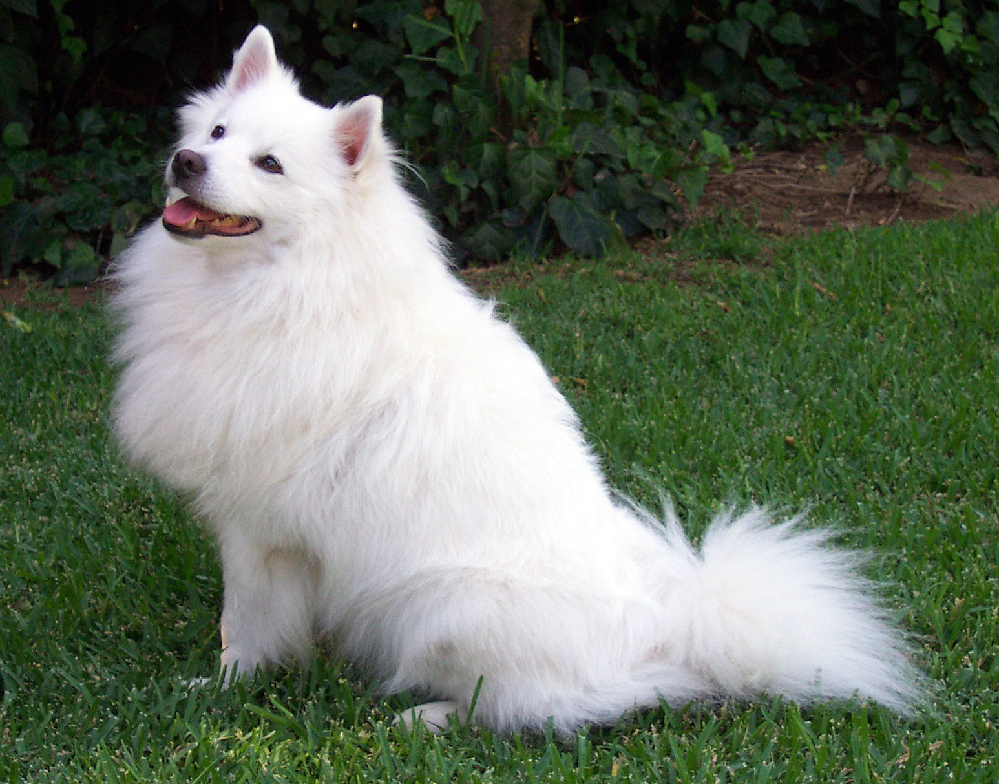

In [20]:
input_image

In [15]:
with torch.no_grad():
    output = model_vgg(input_batch)

In [17]:
probabilities = torch.nn.functional.softmax(output[0], dim=0)
print(probabilities)


tensor([6.8148e-09, 7.0055e-09, 2.3454e-08, 4.1059e-09, 4.0281e-09, 1.3437e-08,
        1.2574e-09, 9.6985e-06, 7.0925e-05, 1.4849e-08, 8.3861e-10, 3.0629e-09,
        4.6242e-09, 9.1869e-09, 3.6537e-09, 4.8169e-09, 2.0087e-08, 3.1707e-07,
        3.1297e-07, 1.8297e-08, 5.6626e-09, 9.3822e-09, 8.7320e-09, 1.3365e-07,
        1.8094e-09, 4.8421e-09, 1.5755e-08, 6.8068e-08, 3.3808e-08, 8.0591e-07,
        1.1345e-09, 5.2387e-09, 3.6709e-09, 3.1216e-10, 1.4732e-09, 2.0691e-09,
        7.9956e-09, 2.4125e-09, 1.4774e-09, 4.1296e-09, 1.1372e-08, 1.7661e-09,
        7.4286e-10, 1.0664e-09, 1.5502e-09, 6.7712e-09, 2.0847e-07, 9.7087e-10,
        1.1494e-09, 9.5960e-09, 1.0152e-07, 8.9839e-10, 4.3572e-08, 4.6038e-09,
        1.5899e-08, 1.0136e-08, 5.9838e-09, 2.7953e-09, 5.6332e-09, 1.7639e-08,
        1.8310e-08, 9.9204e-11, 4.3424e-10, 1.7150e-08, 9.2450e-09, 2.5994e-09,
        3.1607e-09, 2.7653e-09, 1.1263e-09, 5.9138e-10, 3.6359e-08, 1.1683e-08,
        5.0202e-09, 1.8203e-08, 1.3649e-

In [18]:
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt


--2024-11-11 14:49:10--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0s      

2024-11-11 14:49:11 (43.6 MB/s) - ‘imagenet_classes.txt’ saved [10472/10472]



In [19]:
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

Samoyed 0.9121476411819458
Eskimo dog 0.020024646073579788
white wolf 0.018502522259950638
Pomeranian 0.014926420524716377
Arctic fox 0.011059977114200592


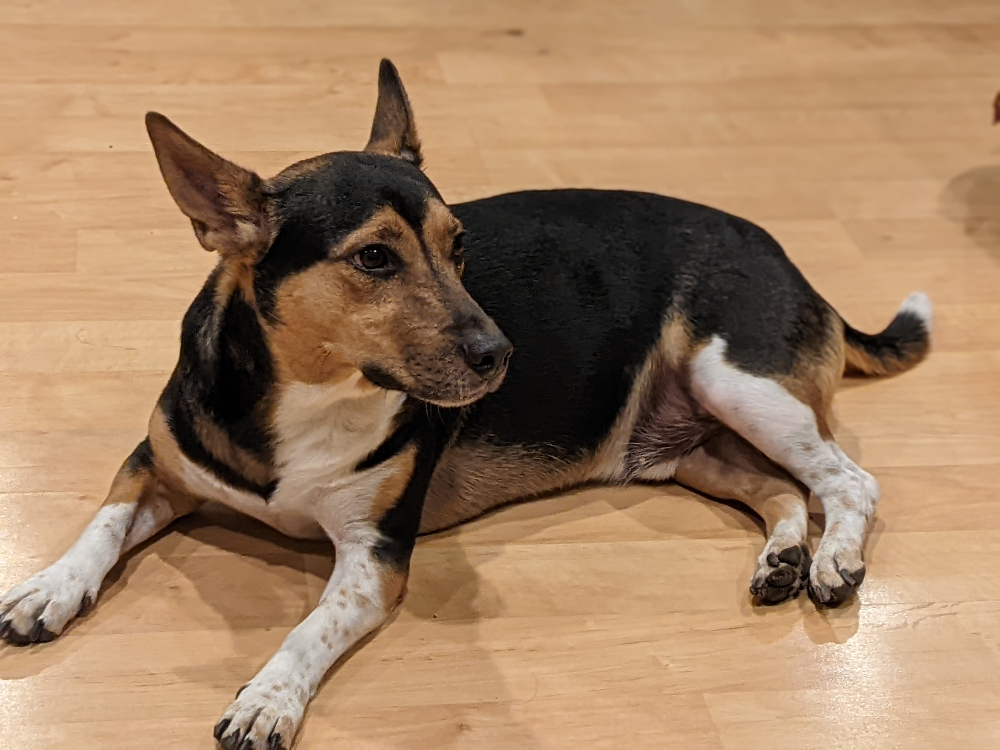

In [21]:
buddyImage = Image.open('testImages/buddyVGG.jpg')
buddyImage

In [22]:
input_tensor = preprocess(buddyImage)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model


In [23]:
with torch.no_grad():
    output = model_vgg(input_batch)

In [24]:
probabilities = torch.nn.functional.softmax(output[0], dim=0)


In [25]:
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

Walker hound 0.4550482928752899
basset 0.23100058734416962
English foxhound 0.13883458077907562
basenji 0.058533791452646255
beagle 0.03299780935049057
